##Sayyidan Muhamad Ikhsan
##20/460160/TK/50749


Step by step dari jurnal
1. Input color image I (Fig. 4a)
2. Separate R, G and B components
3. Normalize G component to obtain Gn using the relation Gn = G/Gmean, where Gmean is the
mean value of G component
4. Contrast enhance Gn to obtain G’ using imadjust function of MATLAB
5. Normalize B component to obtain Bn using the relation Bn = B/Bmean, where Bmean is the
mean value of B component
6. Combine G’, G’, Bn to obtain IGGB (Fig. 4b)


In [ ]:
#import lib open-cv, numpy, dan matplotlib
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def imadjust(x,a,b,c,d,gamma=1):
    # Similar to imadjust in MATLAB.
    # Converts an image range from [a,b] to [c,d].
    # The Equation of a line can be used for this transformation:
    #   y=((d-c)/(b-a))*(x-a)+c
    # However, it is better to use a more generalized equation:
    #   y=((x-a)/(b-a))^gamma*(d-c)+c
    # If gamma is equal to 1, then the line equation is used.
    # When gamma is not equal to 1, then the transformation is not linear.

    y = (((x - a) / (b - a)) ** gamma) * (d - c) + c
    return y

In [ ]:
def ggbtransform(image):
  #Step 1 : Input color image
  #karena cv2 memiliki format warna default BGR, maka kita perlu men-convertnya menjadi RGB menggunakan cv2.COLOR_BGR2RGB
  img = cv2.imread(image)
  img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  #Step 2 : Separate R, G, and B Component
  #digunakan fungsi cv2.split untuk membagi channel gambar menjadi komponen-komponen warna R,G,B nya
  b,g,r=cv2.split(img2)
  cv2_imshow(b)
  cv2_imshow(g)
  cv2_imshow(r)

  #Step 3 : Normalize G component to obtain Gn using the relation Gn = G/Gmean, where Gmean is the mean value of G component
  gmean = np.array(g).mean(axis=(0,1))
  gn=g/gmean

  #Step 4 : Contrast enhance Gn to obtain G’ using imadjust function of MATLAB
  #Sebagai alternatif matlab, digunakan perhitungan alternatif yang didapatkan dari github
  arr = np.asarray(gn)
  gnew = imadjust(arr,arr.min(),arr.max(),0,1)

  #Step 5 : Normalize B component to obtain Bn using the relation Bn = B/Bmean, where Bmean is the mean value of B component
  bmean = np.array(b).mean(axis=(0,1))
  bn=b/bmean

  #Step 6: Combine G’, G’, Bn to obtain IGGB
  ggb1=cv2.merge((gnew,gnew,bn))
  #ggb1=cv2.merge((gn,gn,bn))

  #Step 7: Show image
  #ori
  #r,g,b
  #g norm
  #g enhance
  #b norm
  #result

  plt.figure(figsize=(30, 18))
  plt.subplot(151)
  plt.title("Original Image")
  plt.imshow(img2)

  plt.subplot(152)
  plt.title("G normalize")
  plt.imshow(gn)

  plt.subplot(153)
  plt.title("G enhanced")
  plt.imshow(gnew)

  plt.subplot(154)
  plt.title("B normalized")
  plt.imshow(bn)

  plt.subplot(155)
  plt.title("GGB Result")
  plt.imshow(ggb1)
  plt.show


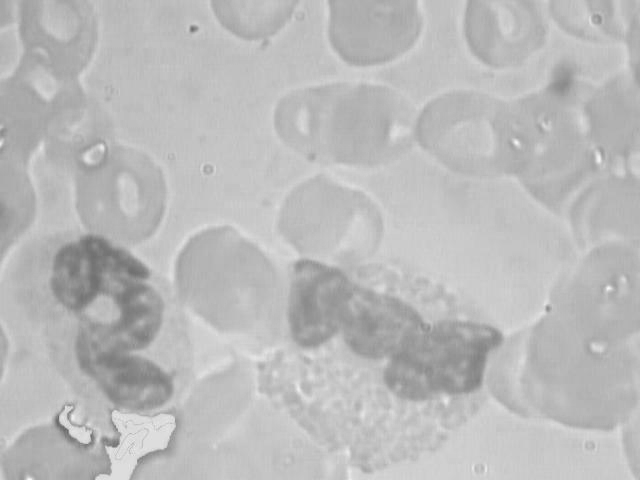

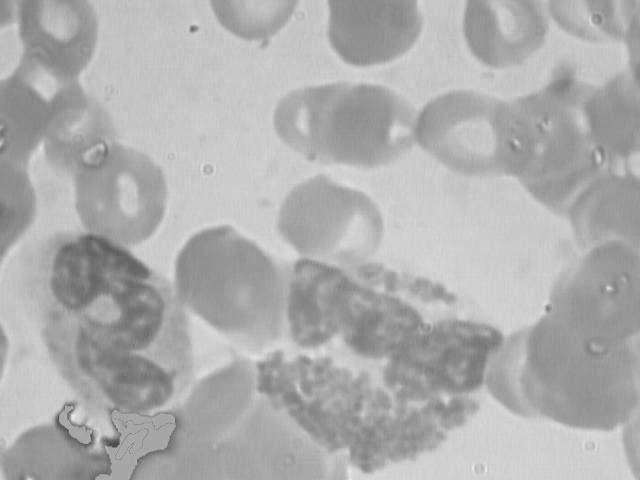

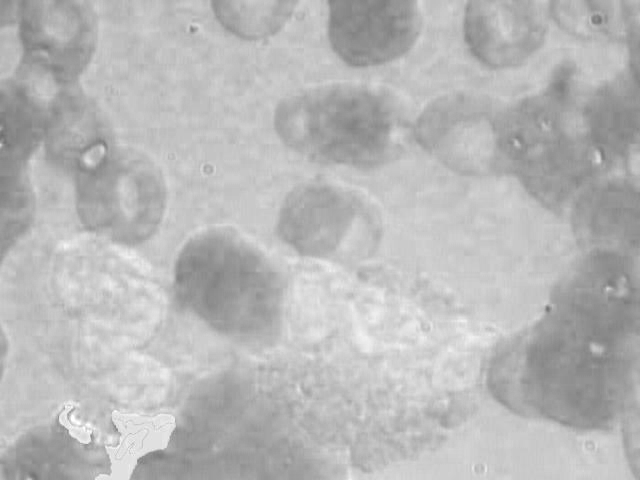

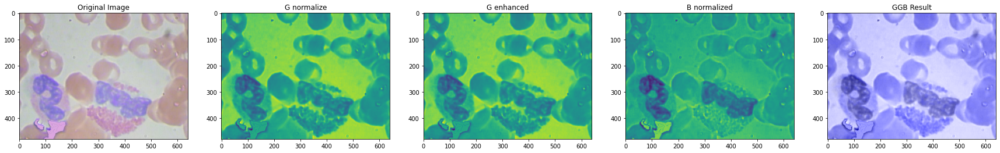

In [ ]:
#First Image
ggbtransform('/content/drive/MyDrive/TPCB/BloodImage_1.jpg')

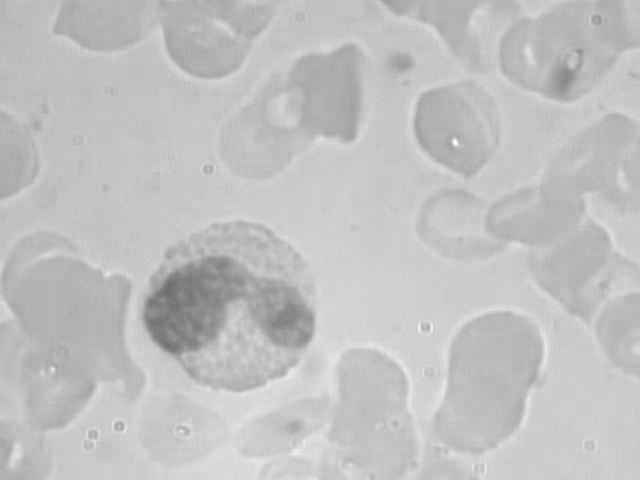

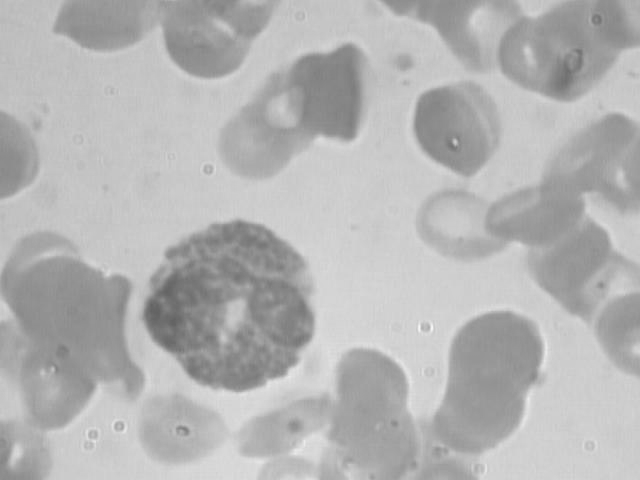

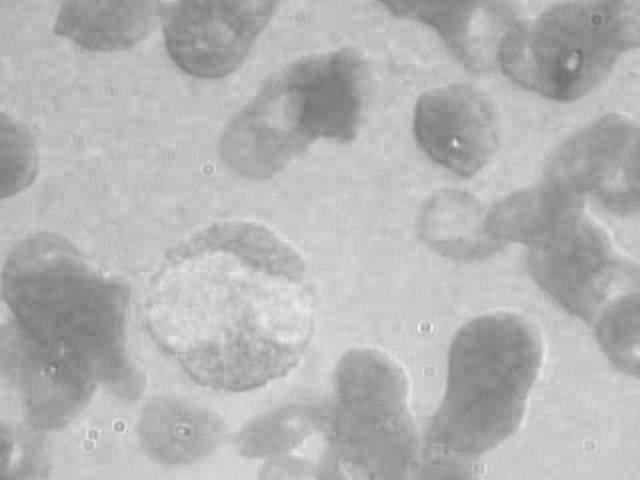

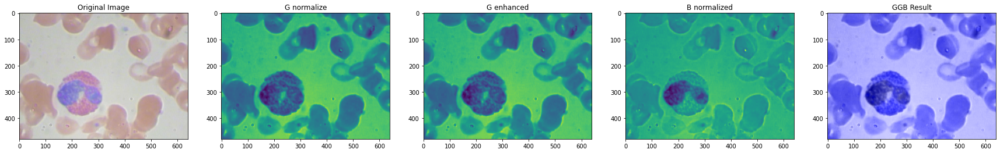

In [ ]:
#First Image
ggbtransform('/content/drive/MyDrive/TPCB/BloodImage_2.jpg')

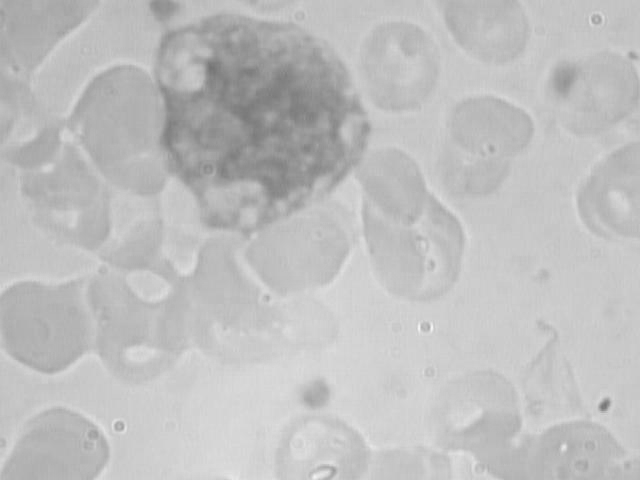

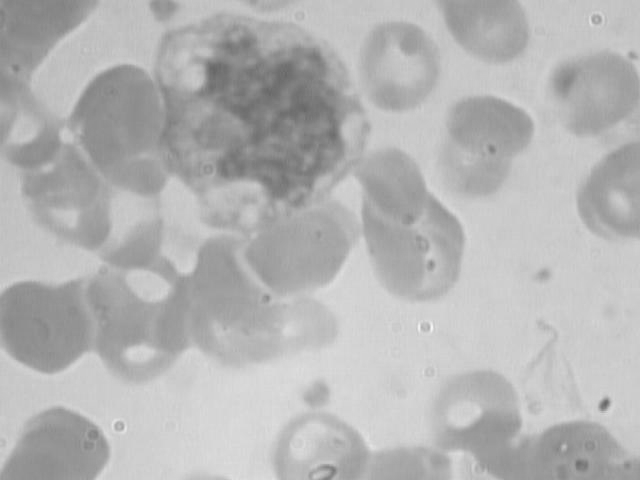

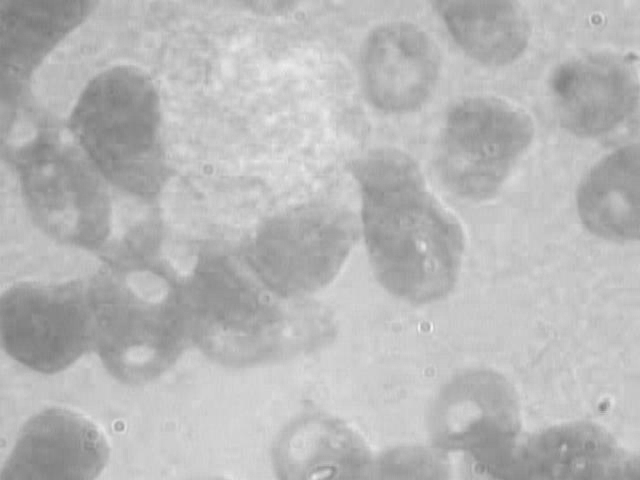

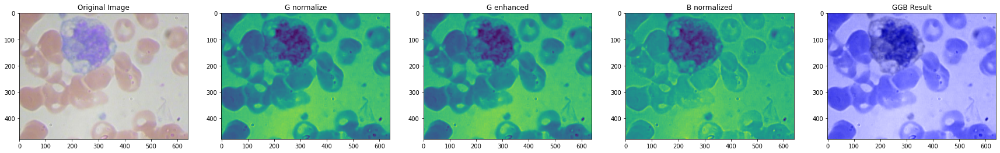

In [ ]:
#First Image
ggbtransform('/content/drive/MyDrive/TPCB/BloodImage_3.jpg')

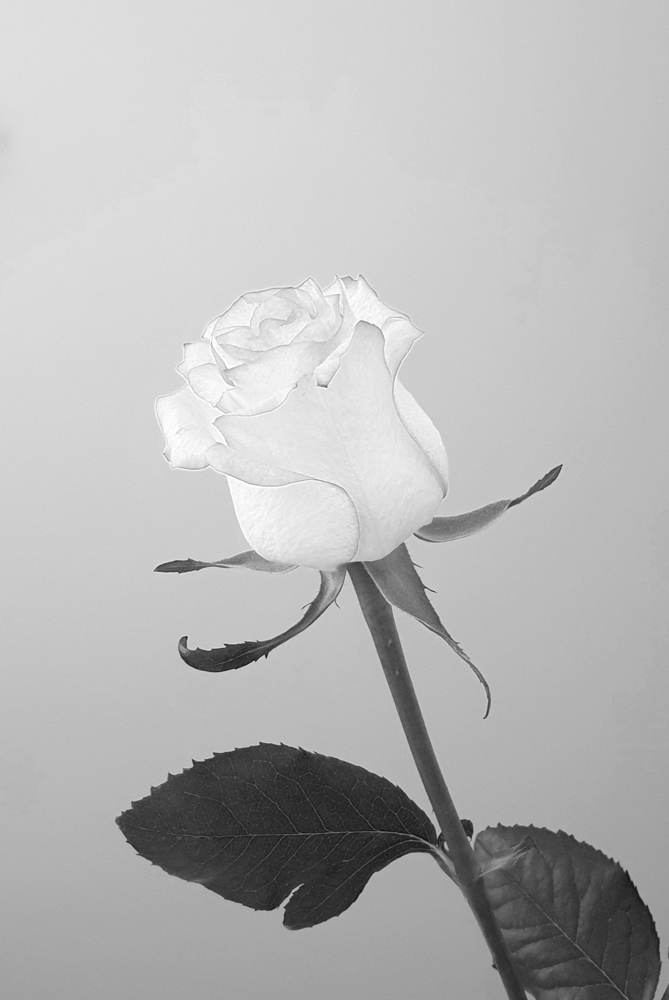

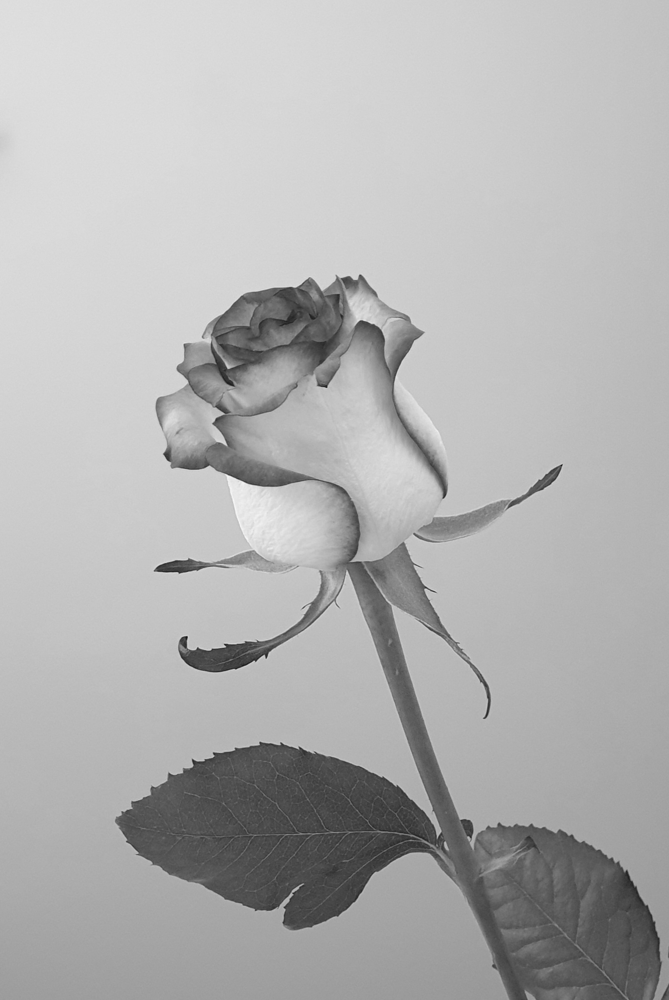

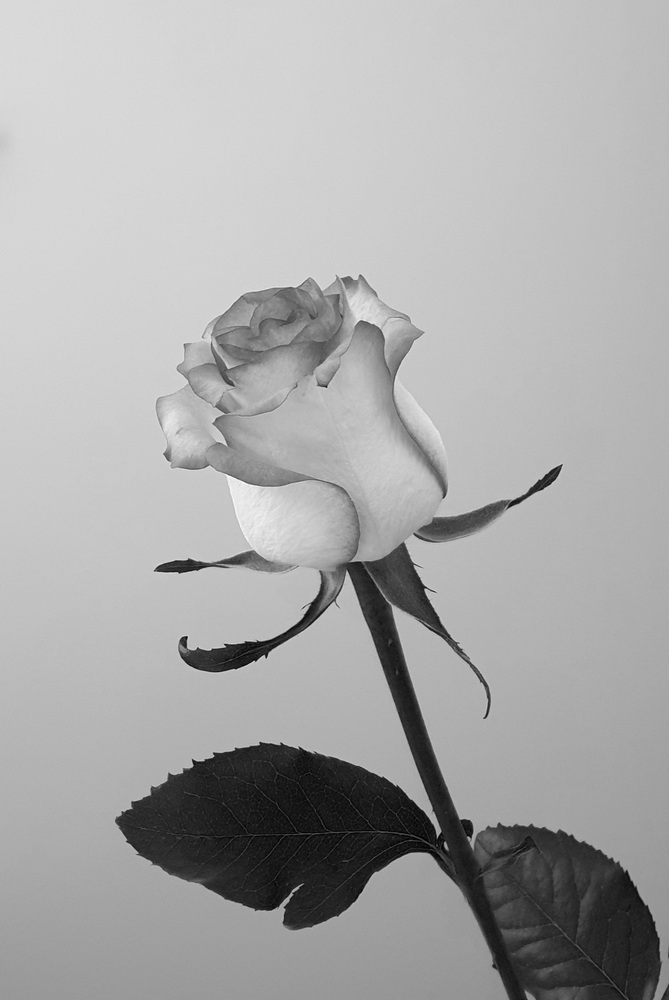

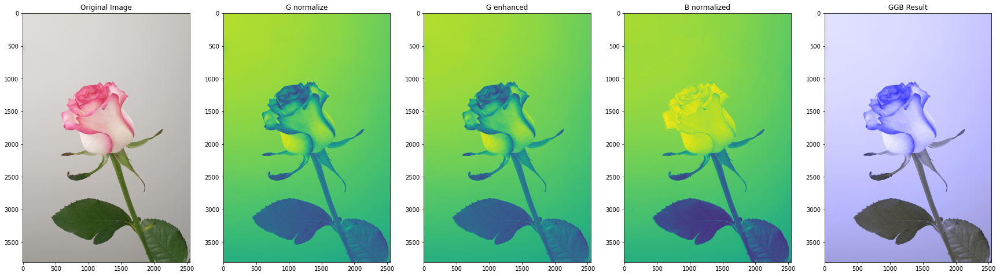

In [ ]:
#fourth Image
ggbtransform('/content/drive/MyDrive/TPCB/rose.jpg')

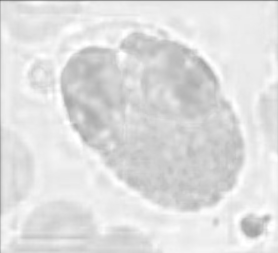

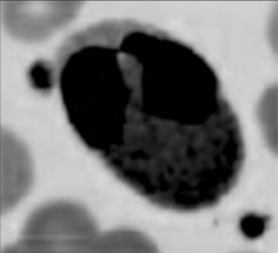

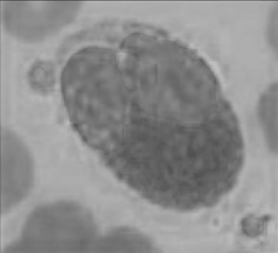

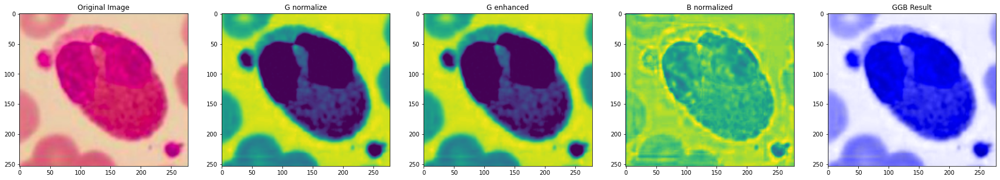

In [ ]:
ggbtransform('/content/drive/MyDrive/TPCB/lukosit.png')

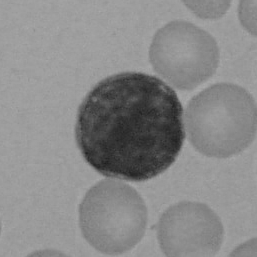

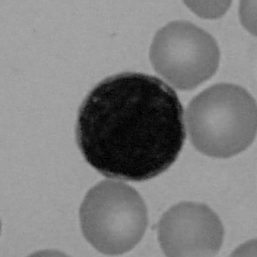

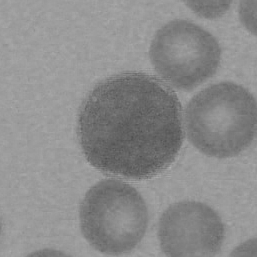

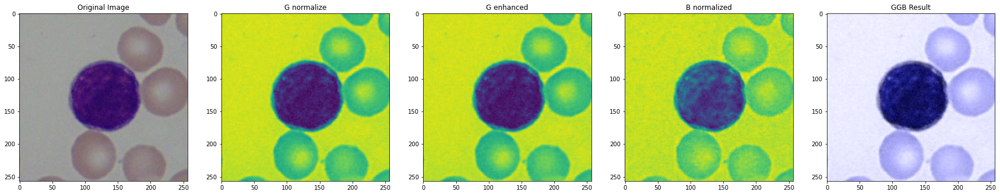

In [ ]:
ggbtransform('/content/drive/MyDrive/TPCB/Im006_1.tif')

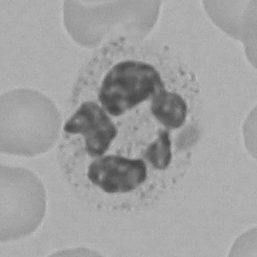

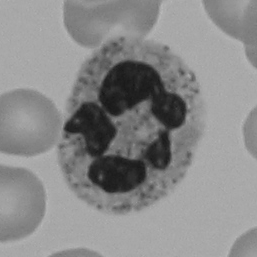

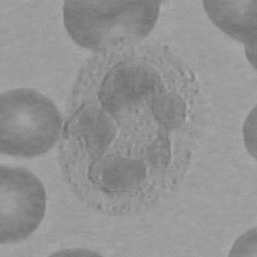

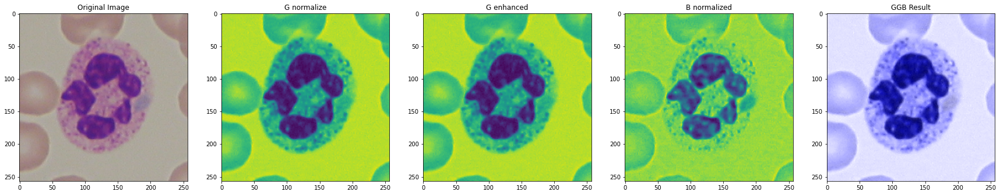

In [ ]:
ggbtransform('/content/drive/MyDrive/TPCB/Im192_0.tif')

In [ ]:
def gbb(image):
  #Step 1 : Input color image
  #karena cv2 memiliki format warna default BGR, maka kita perlu men-convertnya menjadi RGB menggunakan cv2.COLOR_BGR2RGB
  img = cv2.imread(image)
  img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  #Step 2 : Separate R, G, and B Component
  #digunakan fungsi cv2.split untuk membagi channel gambar menjadi komponen-komponen warna R,G,B nya
  b,g,r=cv2.split(img2)
  #cv2_imshow(b)
  #cv2_imshow(g)
  #cv2_imshow(r)

  #Step 3 : Normalize G component to obtain Gn using the relation Gn = G/Gmean, where Gmean is the mean value of G component
  gmean = np.array(g).mean(axis=(0,1))
  gn=g/gmean

  #Step 4 : Contrast enhance Gn to obtain G’ using imadjust function of MATLAB
  #Sebagai alternatif matlab, digunakan perhitungan alternatif yang didapatkan dari github
  arr = np.asarray(gn)
  gnew = imadjust(arr,arr.min(),arr.max(),0,1)

  #Step 5 : Normalize B component to obtain Bn using the relation Bn = B/Bmean, where Bmean is the mean value of B component
  bmean = np.array(b).mean(axis=(0,1))
  bn=b/bmean

  #Step 6: Combine
  ggb1=cv2.merge((gnew,bn,bn))


  #Step 7: Show image
  #ori
  #r,g,b
  #g norm
  #g enhance
  #b norm
  #result

  plt.figure(figsize=(10,10))
  plt.subplot(121)
  plt.title("Original Image")
  plt.imshow(img2)

  plt.subplot(122)
  plt.title("GBB Result")
  plt.imshow(ggb1)
  plt.show




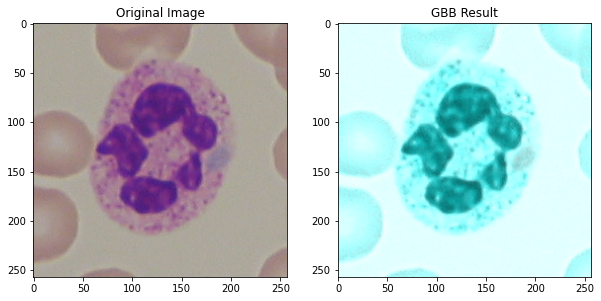

In [ ]:
gbb('/content/drive/MyDrive/TPCB/Im192_0.tif')

In [ ]:
def bgb(image):
  #Step 1 : Input color image
  #karena cv2 memiliki format warna default BGR, maka kita perlu men-convertnya menjadi RGB menggunakan cv2.COLOR_BGR2RGB
  img = cv2.imread(image)
  img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  #Step 2 : Separate R, G, and B Component
  #digunakan fungsi cv2.split untuk membagi channel gambar menjadi komponen-komponen warna R,G,B nya
  b,g,r=cv2.split(img2)
  #cv2_imshow(b)
  #cv2_imshow(g)
  #cv2_imshow(r)

  #Step 3 : Normalize G component to obtain Gn using the relation Gn = G/Gmean, where Gmean is the mean value of G component
  gmean = np.array(g).mean(axis=(0,1))
  gn=g/gmean

  #Step 4 : Contrast enhance Gn to obtain G’ using imadjust function of MATLAB
  #Sebagai alternatif matlab, digunakan perhitungan alternatif yang didapatkan dari github
  arr = np.asarray(gn)
  gnew = imadjust(arr,arr.min(),arr.max(),0,1)

  #Step 5 : Normalize B component to obtain Bn using the relation Bn = B/Bmean, where Bmean is the mean value of B component
  bmean = np.array(b).mean(axis=(0,1))
  bn=b/bmean

  #Step 6: Combine
  ggb1=cv2.merge((bn,gnew,bn))


  #Step 7: Show image
  #ori
  #r,g,b
  #g norm
  #g enhance
  #b norm
  #result

  plt.figure(figsize=(10, 10))
  plt.subplot(121)
  plt.title("Original Image")
  plt.imshow(img2)

  plt.subplot(122)
  plt.title("BGB Result")
  plt.imshow(ggb1)
  plt.show


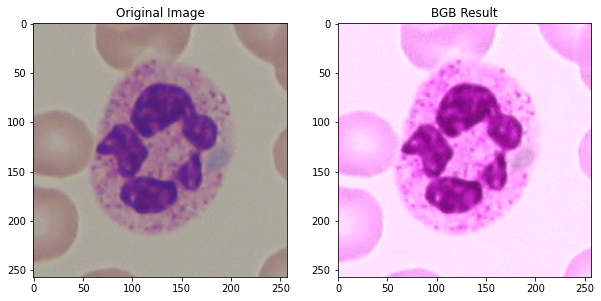

In [ ]:
bgb('/content/drive/MyDrive/TPCB/Im192_0.tif')

In [ ]:
def bbb(image):
  #Step 1 : Input color image
  #karena cv2 memiliki format warna default BGR, maka kita perlu men-convertnya menjadi RGB menggunakan cv2.COLOR_BGR2RGB
  img = cv2.imread(image)
  img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  #Step 2 : Separate R, G, and B Component
  #digunakan fungsi cv2.split untuk membagi channel gambar menjadi komponen-komponen warna R,G,B nya
  b,g,r=cv2.split(img2)
  #cv2_imshow(b)
  #cv2_imshow(g)
  #cv2_imshow(r)

  #Step 3 : Normalize G component to obtain Gn using the relation Gn = G/Gmean, where Gmean is the mean value of G component
  gmean = np.array(g).mean(axis=(0,1))
  gn=g/gmean

  #Step 4 : Contrast enhance Gn to obtain G’ using imadjust function of MATLAB
  #Sebagai alternatif matlab, digunakan perhitungan alternatif yang didapatkan dari github
  arr = np.asarray(gn)
  gnew = imadjust(arr,arr.min(),arr.max(),0,1)

  #Step 5 : Normalize B component to obtain Bn using the relation Bn = B/Bmean, where Bmean is the mean value of B component
  bmean = np.array(b).mean(axis=(0,1))
  bn=b/bmean

  #Step 6: Combine
  ggb1=cv2.merge((bn,bn,bn))


  #Step 7: Show image
  #ori
  #r,g,b
  #g norm
  #g enhance
  #b norm
  #result

  plt.figure(figsize=(10, 10))
  plt.subplot(121)
  plt.title("Original Image")
  plt.imshow(img2)

  plt.subplot(122)
  plt.title("BBB Result")
  plt.imshow(ggb1)
  plt.show


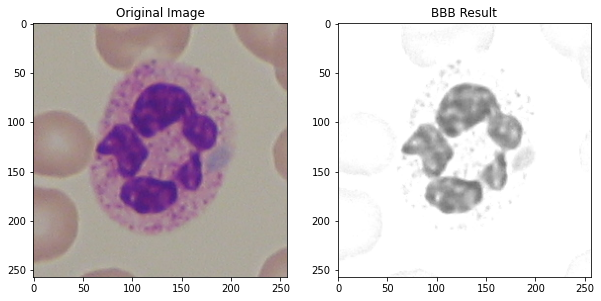

In [ ]:
bbb('/content/drive/MyDrive/TPCB/Im192_0.tif')

In [ ]:
def gbg(image):
  #Step 1 : Input color image
  #karena cv2 memiliki format warna default BGR, maka kita perlu men-convertnya menjadi RGB menggunakan cv2.COLOR_BGR2RGB
  img = cv2.imread(image)
  img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  #Step 2 : Separate R, G, and B Component
  #digunakan fungsi cv2.split untuk membagi channel gambar menjadi komponen-komponen warna R,G,B nya
  b,g,r=cv2.split(img2)
  #cv2_imshow(b)
  #cv2_imshow(g)
  #cv2_imshow(r)

  #Step 3 : Normalize G component to obtain Gn using the relation Gn = G/Gmean, where Gmean is the mean value of G component
  gmean = np.array(g).mean(axis=(0,1))
  gn=g/gmean

  #Step 4 : Contrast enhance Gn to obtain G’ using imadjust function of MATLAB
  #Sebagai alternatif matlab, digunakan perhitungan alternatif yang didapatkan dari github
  arr = np.asarray(gn)
  gnew = imadjust(arr,arr.min(),arr.max(),0,1)

  #Step 5 : Normalize B component to obtain Bn using the relation Bn = B/Bmean, where Bmean is the mean value of B component
  bmean = np.array(b).mean(axis=(0,1))
  bn=b/bmean

  #Step 6: Combine
  ggb1=cv2.merge((gnew,bn,gnew))


  #Step 7: Show image
  #ori
  #r,g,b
  #g norm
  #g enhance
  #b norm
  #result

  plt.figure(figsize=(10, 10))
  plt.subplot(121)
  plt.title("Original Image")
  plt.imshow(img2)

  plt.subplot(122)
  plt.title("GBG Result")
  plt.imshow(ggb1)
  plt.show


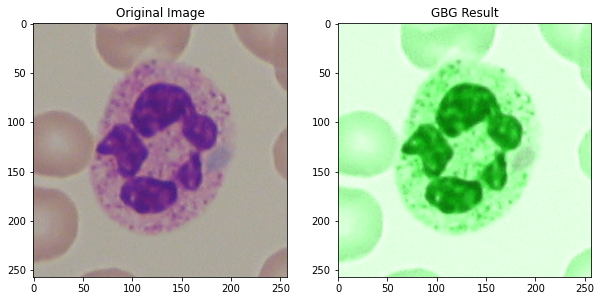

In [ ]:
gbg('/content/drive/MyDrive/TPCB/Im192_0.tif')